# <center>Telco-Customer-Churn Analysis</center>


**BOLBOACĂ MARA**  <br>

## I. Exploratory Data Analysis

### 1.1. Data set import and quantitative data presentation

In [1]:
# libraria pentru lucrul tabelar
import pandas as pd

# libraria pentru functii matematice
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,mean_absolute_percentage_error

import seaborn as sns # pt grafice statistice
import matplotlib.pyplot as plt

import copy
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA 
from pca import pca

from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV #fuck

from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix
import sklearn.metrics as met
from sklearn import metrics






In [48]:
df = pd.read_csv("D:\MASTER\SIIPA_I\SEED python\Proiect\set date nr 12\WA_Fn-UseC_-Telco-Customer-Churn.csv")

df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [4]:
numar_inregistrari_lipsa = df.isna().any(axis=1).sum()

#'isna' is only applicable for numerical data type

numar_inregistrari_lipsa

0

**I noticed that the TotalCharges attribute should be of numeric type. It contains null values that are noted as blank space /NaN, I will code them as 0.**

In [5]:
# TotalCharges should be of type int

df1 = df[df["TotalCharges"]== ' ']
df1

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


In [6]:
df.TotalCharges.replace(' ', 0, inplace=True)
df["TotalCharges"] = pd.to_numeric(df["TotalCharges"])

df['TotalCharges']

0         29.85
1       1889.50
2        108.15
3       1840.75
4        151.65
         ...   
7038    1990.50
7039    7362.90
7040     346.45
7041     306.60
7042    6844.50
Name: TotalCharges, Length: 7043, dtype: float64

In [7]:
# del df["customerID"]

### 1.2. Qualitative presentation of data

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [50]:
num_attributes_by_type = df.dtypes.value_counts()
num_attributes_by_type

object     18
int64       2
float64     1
Name: count, dtype: int64

In [9]:
df.nunique() #no of unique values

customerID          7043
gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                73
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1585
TotalCharges        6531
Churn                  2
dtype: int64

#### Simple statistics & Graphic representations 

In [10]:
df.describe()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges
count,7043.000000,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692,2279.734304
std,0.368612,24.559481,30.090047,2266.794470
min,0.000000,0.000000,18.250000,0.000000
25%,0.000000,9.000000,35.500000,398.550000
50%,0.000000,29.000000,70.350000,1394.550000
75%,0.000000,55.000000,89.850000,3786.600000
max,1.000000,72.000000,118.750000,8684.800000


In [53]:
df.groupby('Churn', as_index = False).agg(customer_churned = ('customerID',
                                                              'count'))

,Churn,customer_churned
0,No,5174
1,Yes,1869


**The number of customers who canceled the contract: customer_churned YES**
1869

#### Histogram
Distribution density

Text(0.5, 1.0, 'Distributia taxelor totale')

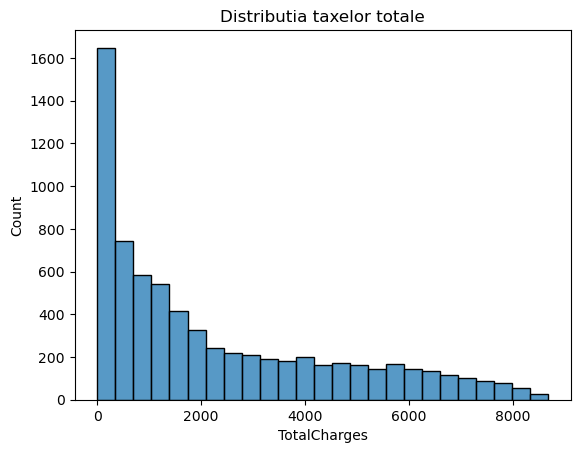

In [12]:
# distributia univariata a taxelor totale
sns.histplot(df['TotalCharges'])
plt.title("Distributia taxelor totale")

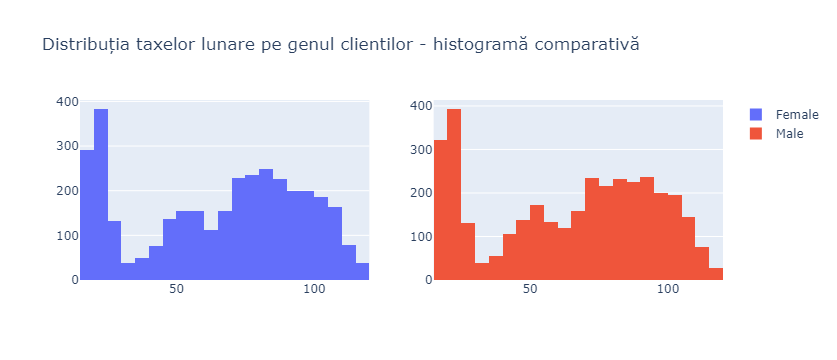

In [13]:
## In doua grafice alaturate reprezentati distributia distantei fata de casa (DistanceFromHome) pentru fiecare statut marital
from plotly.subplots import make_subplots
import plotly.graph_objects as go

x0 = df[df.gender == 'Female'].MonthlyCharges
x1 = df[df.gender == 'Male'].MonthlyCharges

fig = go.Figure()

# definim o matrice de imagini - numărul de linii și coloane decide așezarea în pagină
fig = make_subplots(rows=1, cols=2)

# imaginea din celula (1,1) - poate fi orice grafic, aici e una dintre histograme
fig.add_trace(go.Histogram(x=x0, name ='Female'),
              row=1, col=1)

# imaginea din celula (1,2)
fig.add_trace(go.Histogram(x=x1, name = 'Male'),
              row=1, col=2)

# adăugăm un titlu
fig.update_layout(title = 'Distribuția taxelor lunare pe genul clientilor - histogramă comparativă')
fig.show()

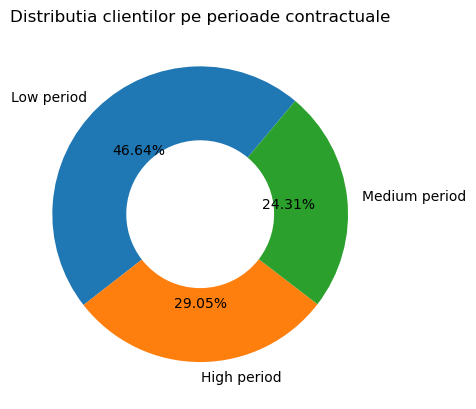

In [15]:
#intervale pentru a grupa anii
bins = np.linspace(min(df['tenure']), max(df['tenure']), 4)
    
bin_labels = ['Low period', 'Medium period', 'High period']

# Create a new column 'Credit History Bins' based on the bins
df['TenureBins'] = pd.cut(df['tenure'], bins=bins, right=False, labels=bin_labels)

#pd.cut -- functie pentru a crea bins - intervale folosite pentru divizarea unor valori mai mari
#Adjusting the bin sizes can impact the level of detail in your visualization.

# Group by the new bins and count the number of loans in each bin
tenure_counts = df['TenureBins'].value_counts()

# Create a donut chart
#plt.figure(figsize=(8, 8))
#explode = (0, 0, 0, 0, 0.1, 0.3, 0.5)  # explode 1st slice

plt.pie(tenure_counts, labels=tenure_counts.index, autopct='%1.2f%%', startangle=50, wedgeprops=dict(width=0.5))
plt.title('Distributia clientilor pe perioade contractuale')
plt.show()

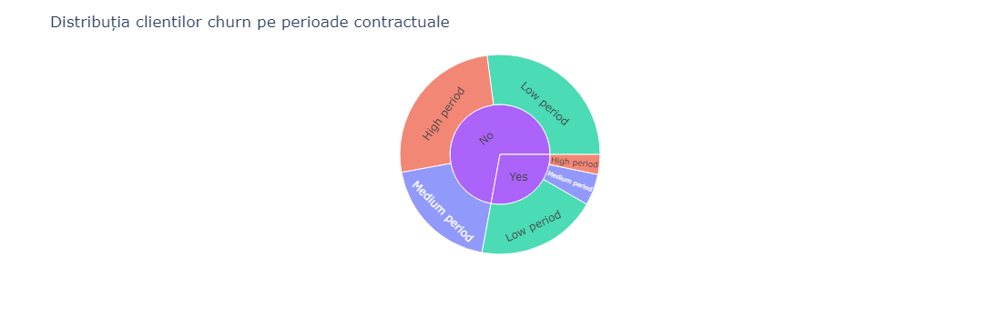

In [16]:
df_agg = df.groupby(['Churn','TenureBins'], as_index = False).agg(
    CustomerCount =('customerID','count'))

import plotly.express as px
import numpy as np

fig = px.sunburst(df_agg, path=['Churn','TenureBins'], values='CustomerCount',
                  color='TenureBins', #hover_data=['iso_alpha'],
                  color_continuous_scale='RdBlu',
                 # color_continuous_midpoint=np.average(df['Purpose'], weights=df['LoanCount'])
                 )
fig.update_layout(title = 'Distribuția clientilor churn pe perioade contractuale')

fig.show()

In [17]:
del df['TenureBins']

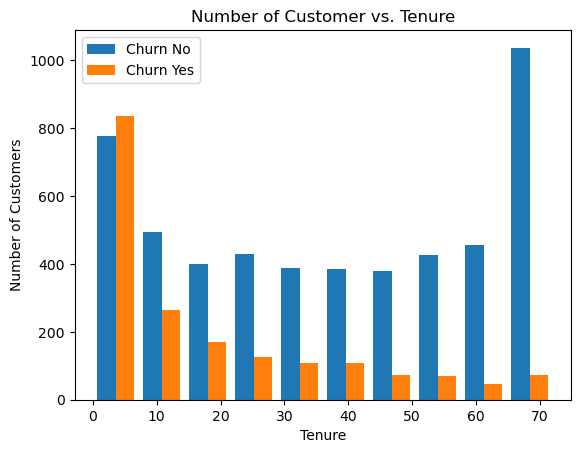

In [21]:
tenure_churn_no = df[df["Churn"] == "No"].tenure
tenure_churn_yes = df[df["Churn"] == "Yes"].tenure

plt.hist([tenure_churn_no, tenure_churn_yes], label = ["Churn No", "Churn Yes"])
plt.xlabel("Tenure")
plt.ylabel("Number of Customers")
plt.title("Number of Customer vs. Tenure")
plt.legend()

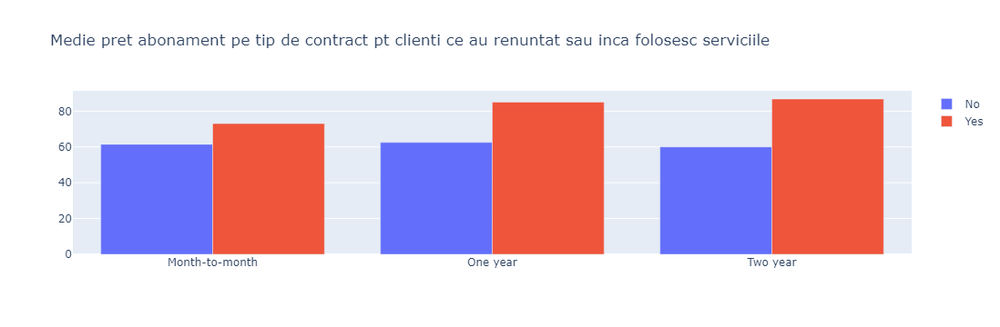

In [23]:
import plotly.graph_objects as go

fig = go.Figure()

df_to_plot = df.groupby(['Contract','Churn'],as_index = False).agg( medie_abonament = ('MonthlyCharges','mean'))



for g in df_to_plot.Churn.unique():
    fig.add_trace(go.Bar(
        x=df_to_plot[df_to_plot.Churn == g].Contract,
        y=df_to_plot[df_to_plot.Churn == g].medie_abonament,
        name= g,
        #marker_color='indianred'
    ))    

# Change the bar mode
fig.update_layout(barmode='group',
                 title = 'Medie pret abonament pe tip de contract pt clienti ce au renuntat sau inca folosesc serviciile')
fig.show()

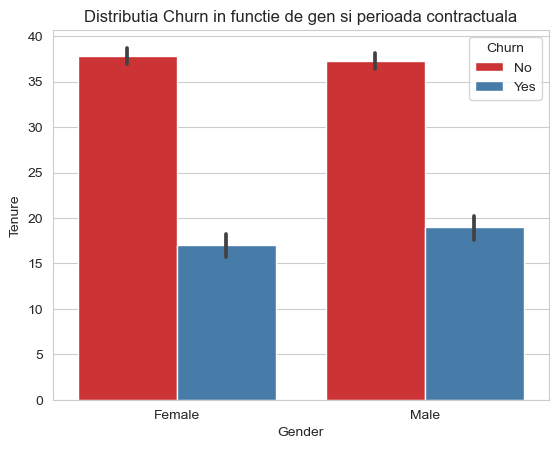

In [24]:
#plt.figure(figsize=(11, 6))

sns.barplot(x='gender', y = 'tenure', hue='Churn', data=df, palette='Set1')


plt.title('Distributia Churn in functie de gen si perioada contractuala')
plt.xlabel('Gender')
plt.ylabel('Tenure')

plt.show()

In [105]:
del df['customerID']

#### Extreme value analysis

There are no negative values for numeric attributes :)

In [18]:
valori_aberante = df[df['TotalCharges'] < 0 ]
valori_aberante.value_counts()

Series([], Name: count, dtype: int64)

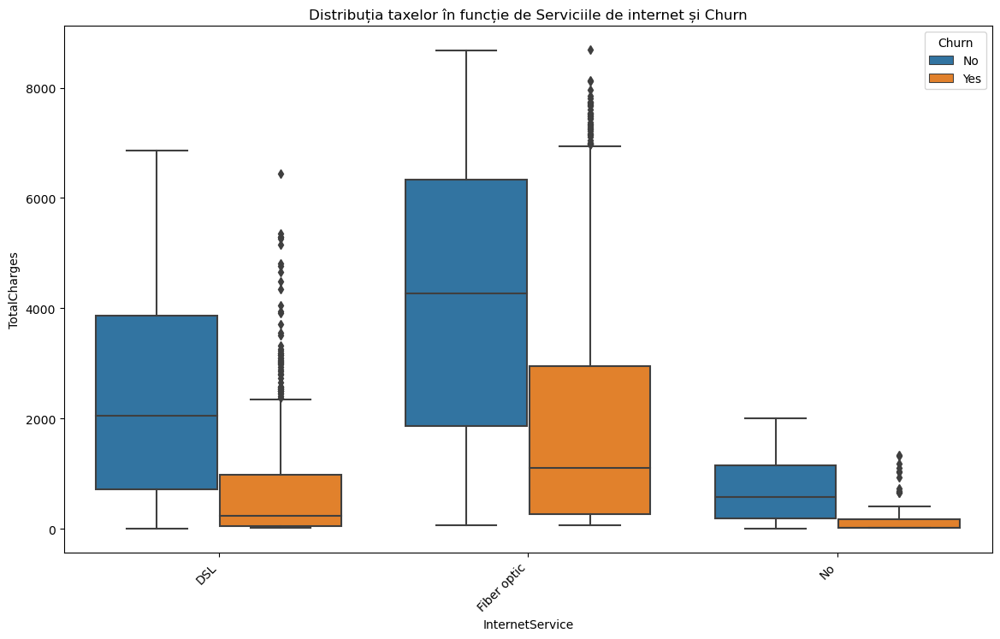

In [19]:
# sns.boxplot(x='Churn', y='TotalCharges', data=df)
# plt.show()

plt.figure(figsize=(14, 8))
sns.boxplot(x='InternetService', y='TotalCharges', hue='Churn', data=df)
plt.title('Distribuția taxelor în funcție de Serviciile de internet și Churn')
plt.xticks(rotation=45, ha='right') 
plt.show()

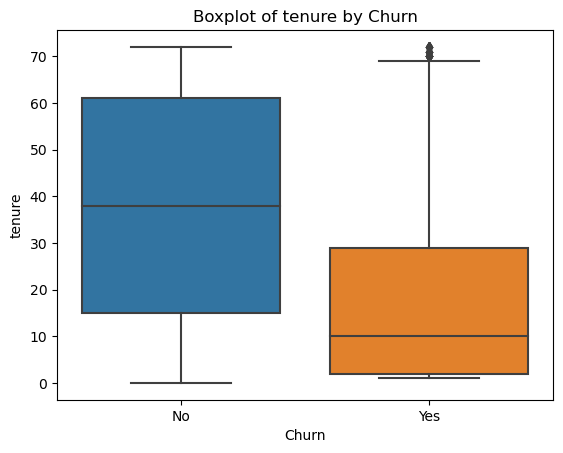

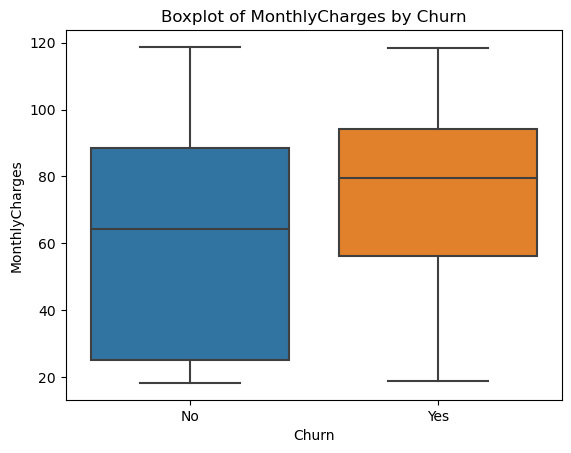

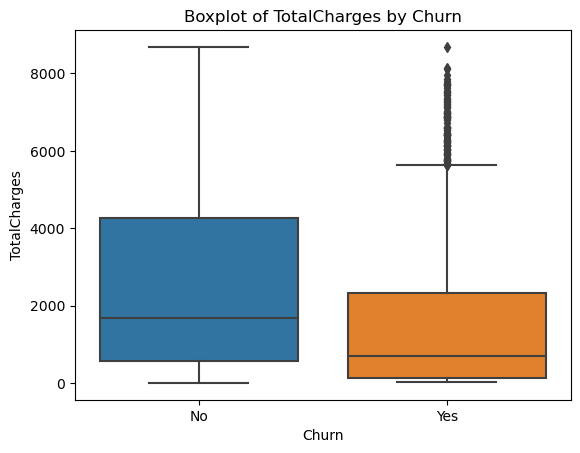

In [20]:
feature_columns = ['tenure', 'MonthlyCharges', 'TotalCharges']

for feature in feature_columns:
            sns.boxplot(data = df, x = 'Churn', y=feature)
            plt.title(f'Boxplot of {feature} by Churn')
            plt.show()



For the attribute churn YES (customers who have finished the contract with the telephone company) we observe outliers or points extremely far from the environment of the majority of the data.

### 1.3. Correlation matrix

#### The correlation matrix of the numerical values before coding the categorical ones

In [27]:
df_num_col = df[['tenure', 'MonthlyCharges', 'TotalCharges']]
num_corr = df_num_col.corr(method = 'pearson')
num_corr

,tenure,MonthlyCharges,TotalCharges
tenure,1.000000,0.247900,0.826178
MonthlyCharges,0.247900,1.000000,0.651174
TotalCharges,0.826178,0.651174,1.000000


<Axes: >

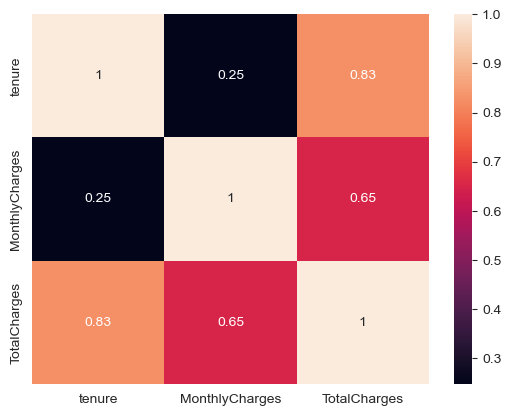

In [28]:
sns.heatmap(num_corr, annot=True)

Tenure / the number of months since the customer uses the services is strongly correlated with the total charges (*TotalCharges*) <br>
Monthly charges (*MonthlyCharges*) are correlated with total charges (*TotalCharges*)

#### Encoding of categorical attributes

- Using LabelEncoder for obvious values of 0/1 YES/NO
- Using get_dummies for the rest of the categorical coluns


In [29]:
# sterg coloana customerID - valori nerelante pt model
import copy
data = copy.deepcopy(df)
#data = data.drop(columns = 'customerID')

In [30]:
data["MultipleLines"].replace("No phone service","No",inplace = True)
# Replace "No phone service" with "No" in every column
data = data.applymap(lambda x: "No" if x == "No internet service" else x)


In [31]:
data.nunique() #no of unique values

gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                73
PhoneService           2
MultipleLines          2
InternetService        3
OnlineSecurity         2
OnlineBackup           2
DeviceProtection       2
TechSupport            2
StreamingTV            2
StreamingMovies        2
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1585
TotalCharges        6531
Churn                  2
dtype: int64

In [32]:
columns_to_encode = ['gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines', 'OnlineSecurity',
                     'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'PaperlessBilling', 'Churn' ]
le=LabelEncoder()

data[columns_to_encode]=data[columns_to_encode].apply(lambda col:le.fit_transform(col))
data

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,0,0,DSL,0,1,0,0,0,0,Month-to-month,1,Electronic check,29.85,29.85,0
1,1,0,0,0,34,1,0,DSL,1,0,1,0,0,0,One year,0,Mailed check,56.95,1889.50,0
2,1,0,0,0,2,1,0,DSL,1,1,0,0,0,0,Month-to-month,1,Mailed check,53.85,108.15,1
3,1,0,0,0,45,0,0,DSL,1,0,1,1,0,0,One year,0,Bank transfer (automatic),42.30,1840.75,0
4,0,0,0,0,2,1,0,Fiber optic,0,0,0,0,0,0,Month-to-month,1,Electronic check,70.70,151.65,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1,0,1,1,24,1,1,DSL,1,0,1,1,1,1,One year,1,Mailed check,84.80,1990.50,0
7039,0,0,1,1,72,1,1,Fiber optic,0,1,1,0,1,1,One year,1,Credit card (automatic),103.20,7362.90,0
7040,0,0,1,1,11,0,0,DSL,1,0,0,0,0,0,Month-to-month,1,Electronic check,29.60,346.45,0
7041,1,1,1,0,4,1,1,Fiber optic,0,0,0,0,0,0,Month-to-month,1,Mailed check,74.40,306.60,1


In [33]:
# apelăm get_dummies - metoda pandas pentru OHE
data = pd.get_dummies(data, columns = ['InternetService', 'Contract', 'PaymentMethod'], dtype = int)

data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 27 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   gender                                   7043 non-null   int32  
 1   SeniorCitizen                            7043 non-null   int64  
 2   Partner                                  7043 non-null   int32  
 3   Dependents                               7043 non-null   int32  
 4   tenure                                   7043 non-null   int64  
 5   PhoneService                             7043 non-null   int32  
 6   MultipleLines                            7043 non-null   int32  
 7   OnlineSecurity                           7043 non-null   int32  
 8   OnlineBackup                             7043 non-null   int32  
 9   DeviceProtection                         7043 non-null   int32  
 10  TechSupport                              7043 no

#### Correlation matrix / Spearman, after coding the categorical values
+ Graphic representation of the correlation matrix

In [34]:
data.corr(method='spearman')

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,...,InternetService_DSL,InternetService_Fiber optic,InternetService_No,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
gender,1.000000,-0.001874,-0.001808,0.010517,0.003486,-0.006488,-0.008414,-0.017021,-0.013773,-0.002105,...,0.006568,-0.011286,0.006026,-0.003386,0.008026,-0.003695,-0.016024,0.001215,0.000752,0.013744
SeniorCitizen,-0.001874,1.000000,0.016479,-0.211185,0.018556,0.008576,0.142948,-0.038653,0.066572,0.059428,...,-0.108322,0.255338,-0.182742,0.138360,-0.046262,-0.117000,-0.016159,-0.024135,0.171718,-0.153477
Partner,-0.001808,0.016479,1.000000,0.452676,0.384931,0.017706,0.142057,0.143106,0.141498,0.153786,...,-0.000851,0.000304,0.000615,-0.280865,0.082783,0.248091,0.110706,0.082029,-0.083852,-0.095125
Dependents,0.010517,-0.211185,0.452676,1.000000,0.164175,-0.001762,-0.024526,0.080972,0.023671,0.013963,...,0.052010,-0.165818,0.139812,-0.231720,0.068368,0.204613,0.052021,0.060267,-0.150642,0.059071
tenure,0.003486,0.018556,0.384931,0.164175,1.000000,0.008483,0.337450,0.328862,0.360032,0.363329,...,0.011718,0.022490,-0.040604,-0.641399,0.212250,0.544480,0.246443,0.236579,-0.209206,-0.239293
PhoneService,-0.006488,0.008576,0.017706,-0.001762,0.008483,1.000000,0.279690,-0.092893,-0.052312,-0.071227,...,-0.452425,0.289999,0.172209,-0.000742,-0.002791,0.003519,0.007556,-0.007721,0.003062,-0.003319
MultipleLines,-0.008414,0.142948,0.142057,-0.024526,0.337450,0.279690,1.000000,0.098108,0.202237,0.201137,...,-0.199920,0.366083,-0.210564,-0.088203,-0.003794,0.106253,0.075527,0.060048,0.083618,-0.227206
OnlineSecurity,-0.017021,-0.038653,0.143106,0.080972,0.328862,-0.092893,0.098108,1.000000,0.283832,0.275438,...,0.321269,-0.030696,-0.333403,-0.246679,0.100162,0.191773,0.095158,0.115721,-0.112338,-0.080798
OnlineBackup,-0.013773,0.066572,0.141498,0.023671,0.360032,-0.052312,0.202237,0.283832,1.000000,0.303546,...,0.157884,0.165651,-0.381593,-0.164172,0.083722,0.111400,0.087004,0.090785,-0.000408,-0.174164
DeviceProtection,-0.002105,0.059428,0.153786,0.013963,0.363329,-0.071227,0.201137,0.275438,0.303546,1.000000,...,0.146291,0.176049,-0.380754,-0.225662,0.102495,0.165096,0.083115,0.111554,-0.003351,-0.187373


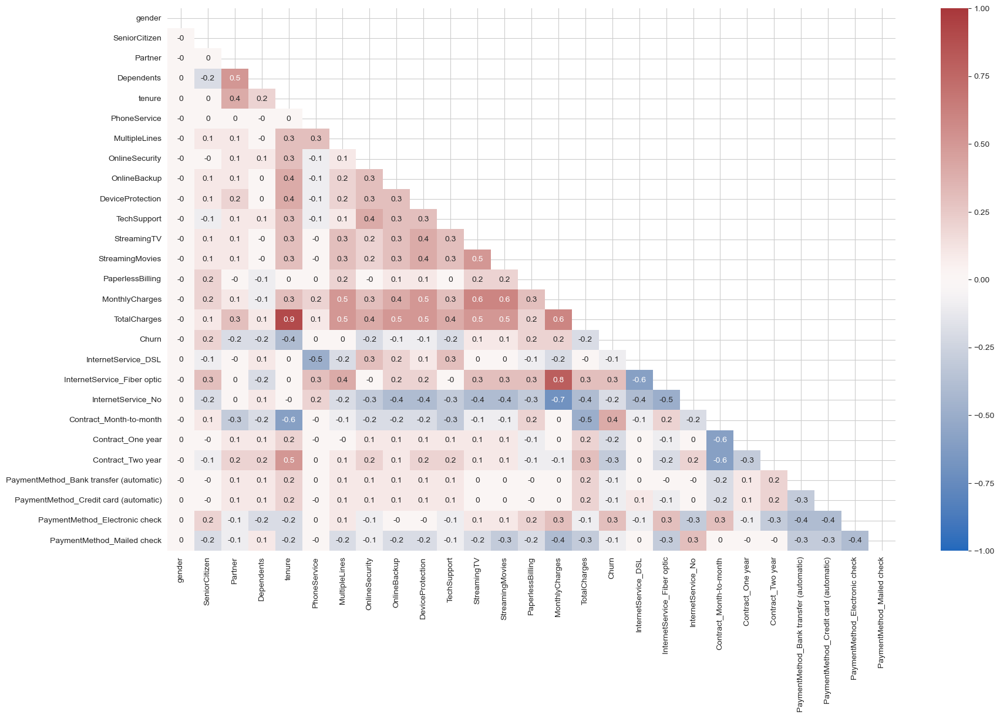

In [35]:
plt.figure(figsize=(20, 12))
matrix = data.corr(method='spearman').round(1)
mask = np.triu(np.ones_like(matrix, dtype=bool))  # np.triu function creates a triangular matrix 
#The mask is True in the upper triangular region and False in the lower triangular region.
sns.heatmap(matrix, annot=True, vmax=1, vmin=-1, center=0, cmap='vlag', mask=mask)
plt.show()

#### Principal Component Analysis / *PCA*

#### 1. Data standardizationIe applied the standardization only to the columns with a wide continuous numerical scale, not to the binary ones.

In [68]:
scalar = StandardScaler()

# Selectează doar coloanele numerice cu scară largă
numeric_columns = ['tenure', 'MonthlyCharges', 'TotalCharges']
df_numeric = data[numeric_columns]

scaled_data = copy.deepcopy(data)

# Aplică standardizarea doar pe acele coloane
scaled_data[numeric_columns] = pd.DataFrame(scalar.fit_transform(df_numeric))

#scaled_data = pd.DataFrame(scalar.fit_transform(data)) #standarziarea datelor
scaled_data.columns = data.columns # păstrăm numele coloanelor
scaled_data

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,...,InternetService_DSL,InternetService_Fiber optic,InternetService_No,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,-1.277445,0,0,0,1,0,...,1,0,0,1,0,0,0,0,1,0
1,1,0,0,0,0.066327,1,0,1,0,1,...,1,0,0,0,1,0,0,0,0,1
2,1,0,0,0,-1.236724,1,0,1,1,0,...,1,0,0,1,0,0,0,0,0,1
3,1,0,0,0,0.514251,0,0,1,0,1,...,1,0,0,0,1,0,1,0,0,0
4,0,0,0,0,-1.236724,1,0,0,0,0,...,0,1,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1,0,1,1,-0.340876,1,1,1,0,1,...,1,0,0,0,1,0,0,0,0,1
7039,0,0,1,1,1.613701,1,1,0,1,1,...,0,1,0,0,1,0,0,1,0,0
7040,0,0,1,1,-0.870241,0,0,1,0,0,...,1,0,0,1,0,0,0,0,1,0
7041,1,1,1,0,-1.155283,1,1,0,0,0,...,0,1,0,1,0,0,0,0,0,1


#### 2. Finding the principal components

In [69]:
pca = PCA(n_components=4) 
pca_result = pca.fit_transform(scaled_data)


data_pca = pd.DataFrame(pca_result, columns=['PC1', 'PC2', 'PC3', 'PC4'])
data_pca

,PC1,PC2,PC3,PC4
0,-1.975202,0.224794,0.856853,0.197111
1,-0.430602,-0.762135,0.913020,-0.502600
2,-1.666403,0.639134,1.090906,-0.297622
3,-0.213578,-1.302171,1.272799,-0.710118
4,-1.416914,1.649588,-0.374123,-0.165236
...,...,...,...,...
7038,0.635672,0.082024,1.282808,1.066755
7039,3.377348,-0.323604,-0.592172,0.447045
7040,-1.734411,-0.183561,0.883711,0.825667
7041,-1.104316,1.391916,-0.661128,0.417799


<Axes: >

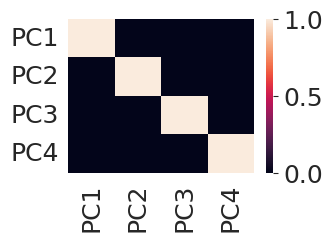

In [66]:
#verficăm noile corelații
plt.figure(figsize=(3, 2))
sns.heatmap(data_pca.corr())


The heatmap above clearly shows that there is no correlation between the various principal components obtained (PC1, PC2, PC3 and PC4). Thus, we moved from a feature space of higher dimensions to a feature space of lower dimensions, while ensuring that any correlation between the PCs thus obtained is minimal.

#### 3. Determination of those main components that together explain 90% of the total variation of the data

In [70]:
# Fit PCA
pca = PCA()
data_pca = pca.fit_transform(scaled_data)

# Calculate cumulative explained variance
cumulative_variance_ratio = pca.explained_variance_ratio_.cumsum()

# Find the number of components needed to explain 90% of the variance
n_components_90_percent = (cumulative_variance_ratio >= 0.90).argmax() + 1

print(f"Number of components to explain 90% of variance: {n_components_90_percent}")

# Retrain PCA with the determined number of components
pca = PCA(n_components=n_components_90_percent)
data_pca = pca.fit_transform(scaled_data)
data_pca = pd.DataFrame(data_pca, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 
                                             'PC13', 'PC14',  'PC15'])

Number of components to explain 90% of variance: 15


In [40]:
display(data_pca)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
0,-1.975201,0.224786,0.853424,0.188540,1.172018,-0.556965,0.238286,0.053315,-0.343296,0.360291,0.277920,-0.338387,0.165008,-0.510429,0.341522
1,-0.430604,-0.762123,0.919249,-0.497716,-0.848948,0.692753,0.486871,0.143716,0.069629,0.612181,0.087855,0.131610,0.115075,0.883996,0.286658
2,-1.666403,0.639127,1.090812,-0.290792,-0.137346,0.382905,-0.612571,0.151178,-0.538636,0.355381,0.826070,-0.100298,0.140813,0.007185,-0.380936
3,-0.213579,-1.302161,1.274859,-0.722616,-0.249066,0.518267,0.414459,0.894110,-0.117716,0.122975,-0.767815,0.016360,-0.322482,0.696316,0.310898
4,-1.416914,1.649589,-0.379317,-0.186250,0.263575,-0.500750,0.163737,-0.067154,-0.035449,0.068507,-0.004127,-0.252525,-0.573711,0.142622,-0.002217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0.635672,0.082029,1.284902,1.086693,-0.786280,0.671754,0.543169,0.059719,0.022236,-0.351179,0.602887,1.229643,-0.035942,0.371331,0.102081
7039,3.377348,-0.323587,-0.591159,0.448180,-0.320445,-0.273698,0.864637,-0.561356,-0.667929,-0.217464,0.210631,-0.179682,0.598802,-0.340514,0.190882
7040,-1.734411,-0.183541,0.886719,0.813090,1.193659,-0.559110,0.168083,-0.008021,-0.296664,0.374089,0.143899,0.016167,-0.443678,0.451977,-0.097566
7041,-1.104318,1.391888,-0.659442,0.410913,-0.227359,0.409946,-0.569441,0.101055,-0.489551,0.006041,0.559793,0.472112,0.649863,0.612224,-0.116535


[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [90.0%] explained variance using the [27] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [15] that covers the [90.00%] explained variance.
[pca] >The PCA reduction is performed on the [27] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[15]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


[scatterd] >INFO> Create scatterplot
[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 with loadings.


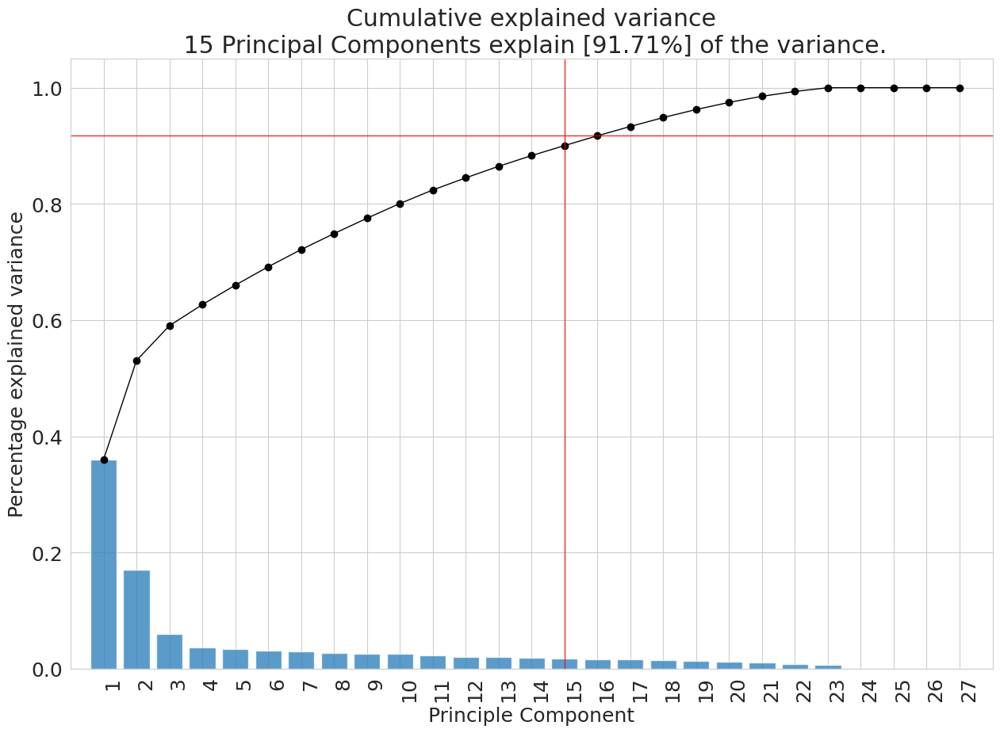

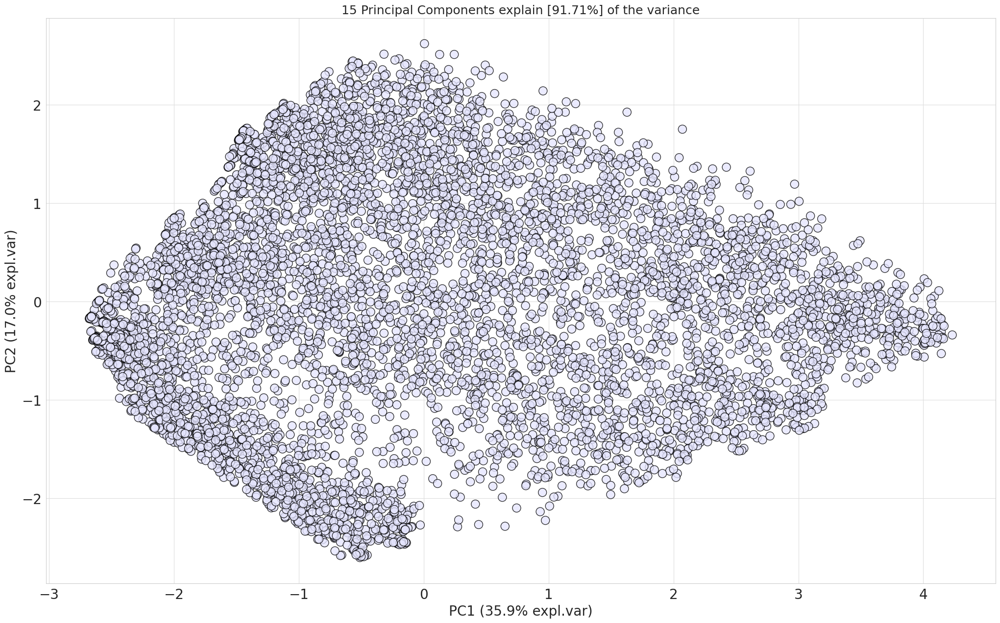

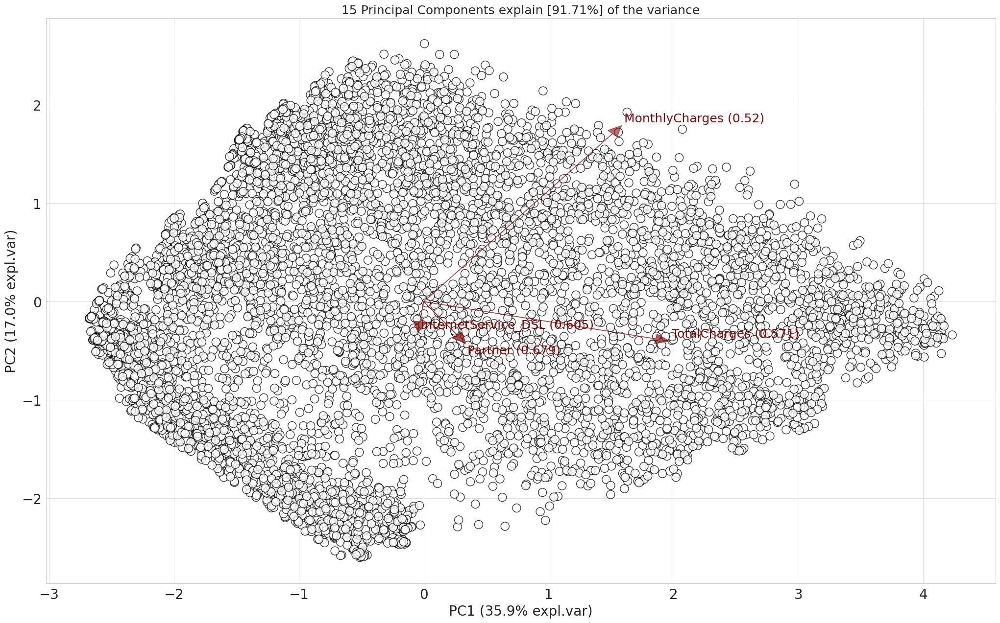

In [71]:
from pca import pca

model = pca(n_components=0.90)

# antrenare și transformare (deși am schimnbat modulul, numele metodei a rămas același!)
results = model.fit_transform(X=scaled_data)

# grafic de bare cu varianța explicată
fig, ax = model.plot()

# grqfic de împrăștiere (scatter plot) cu primele două componente
fig, ax = model.scatter(c= [0.9, 0.9, 1])

# biplot
fig, ax = model.biplot(n_feat=4, c= [1, 1, 1])

### 1.4 Tendencies, trends, relationships between variables

#### Various graphs to visualize and evaluate the impact of each attribute on the dependent variable (churn)

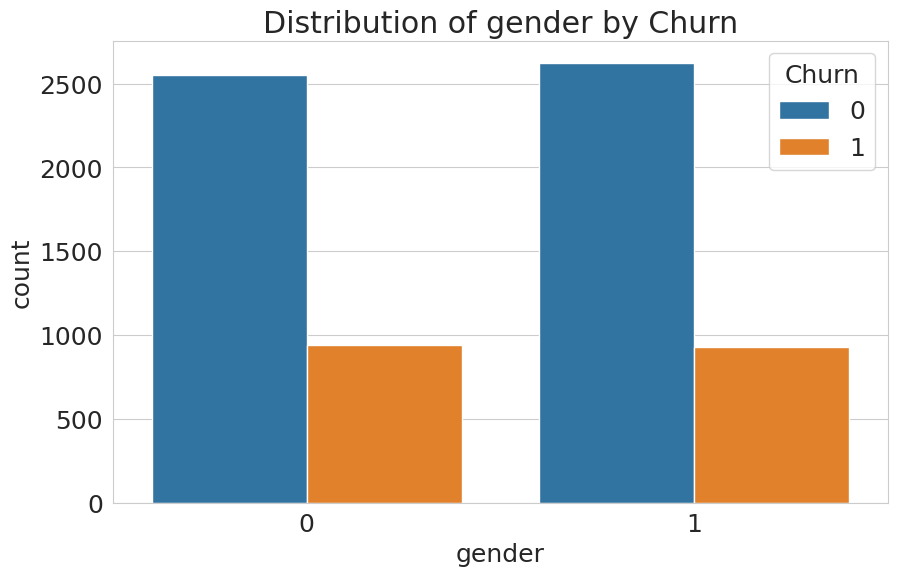

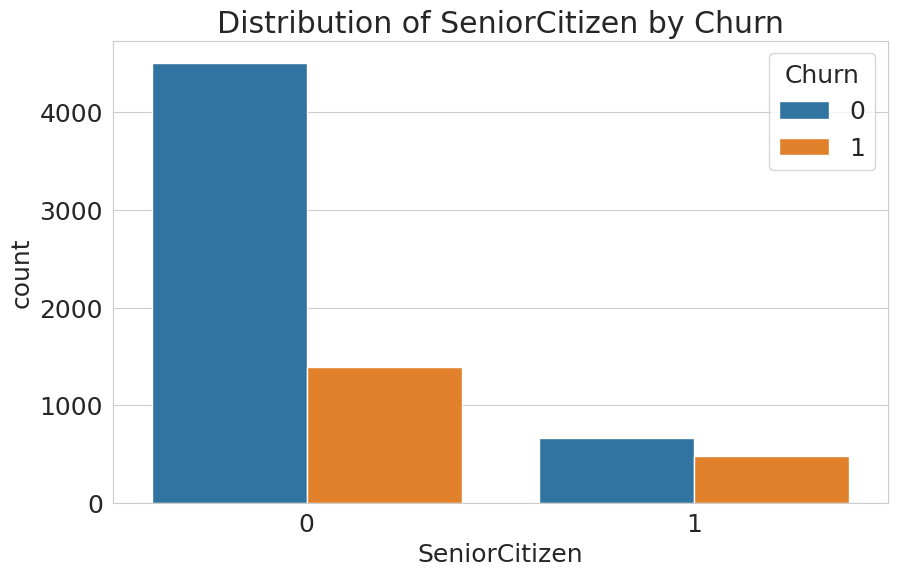

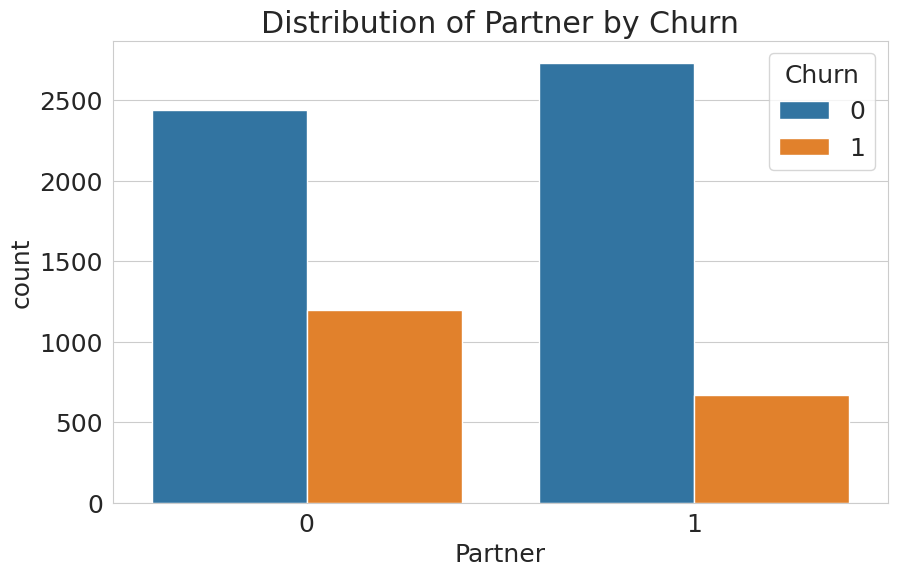

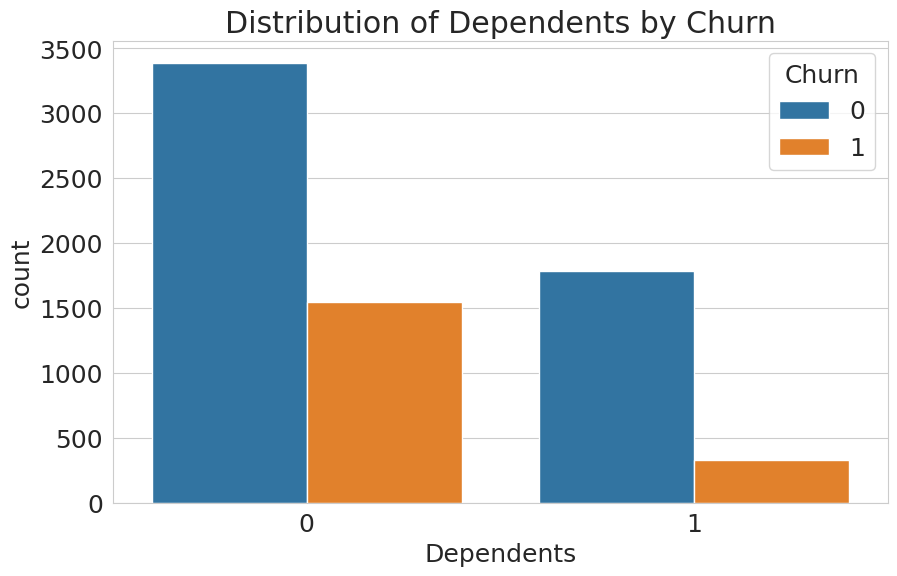

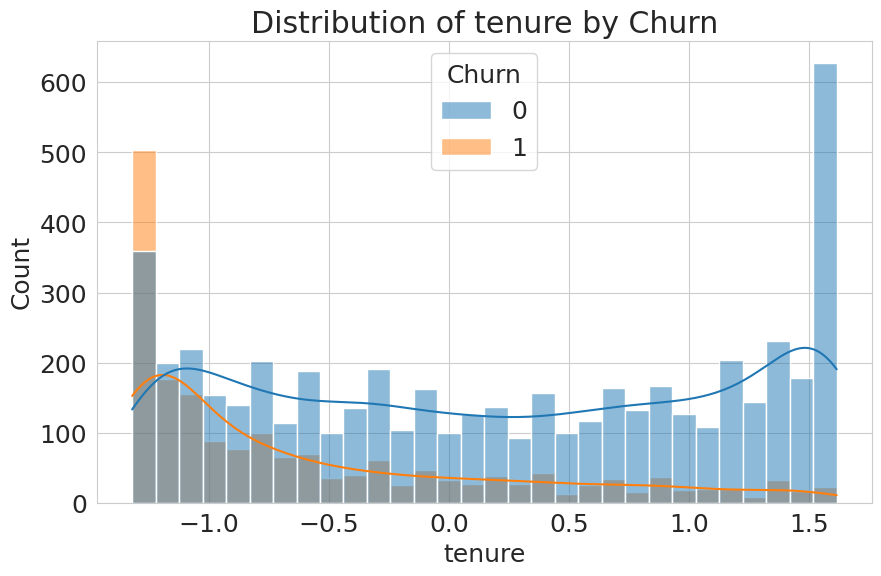

...

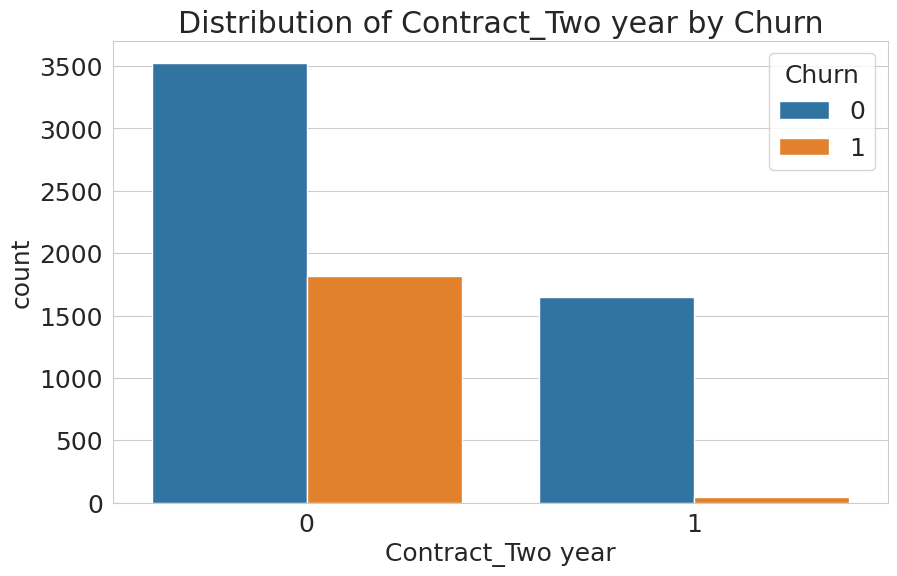

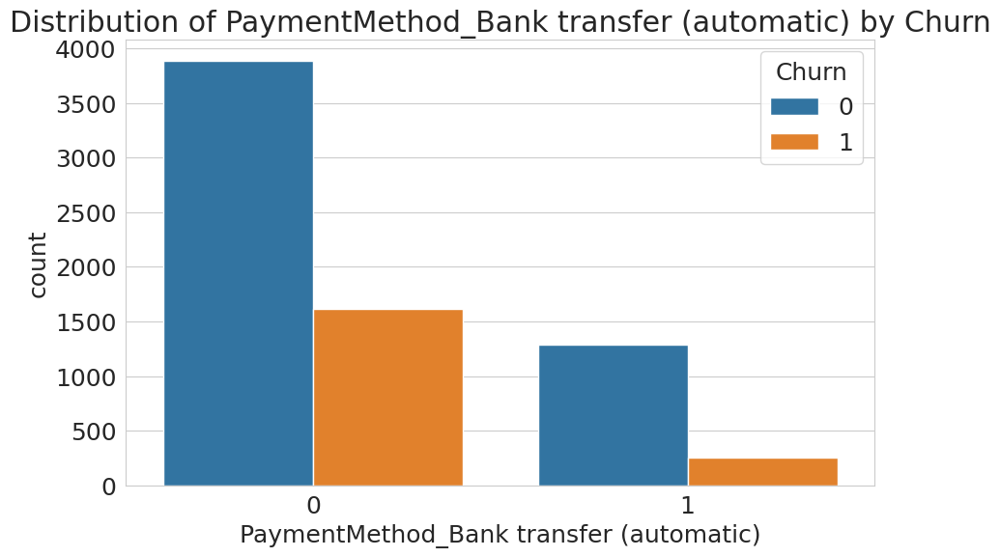

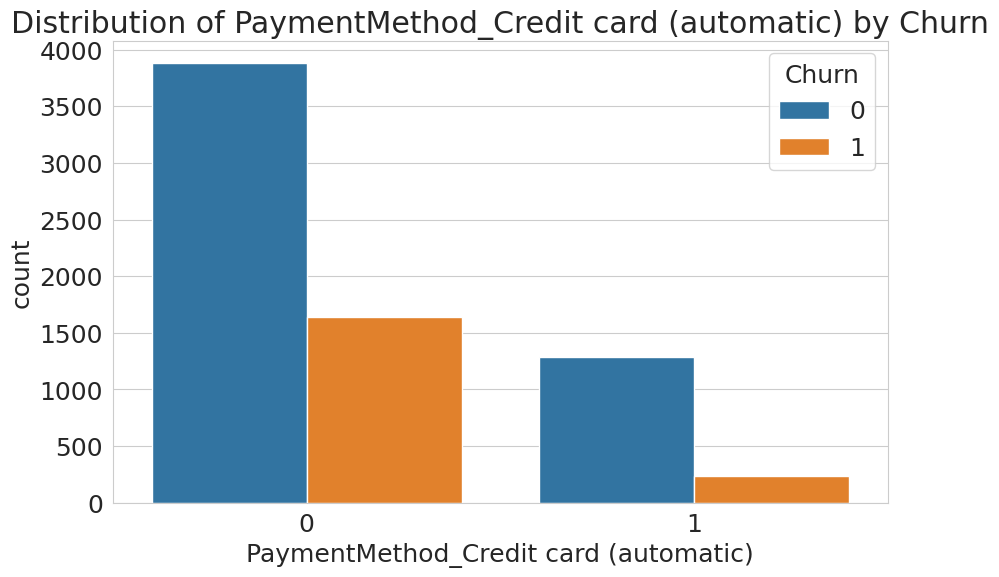

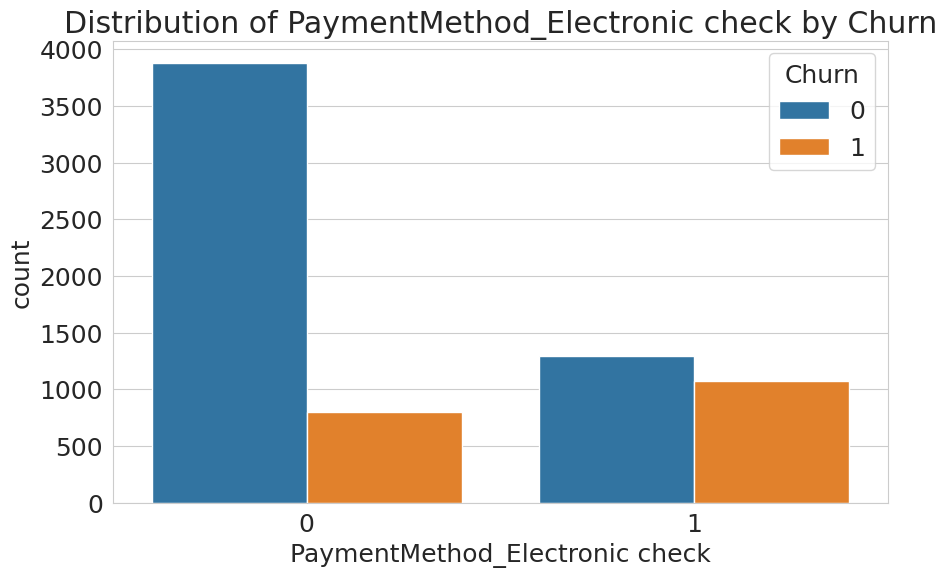

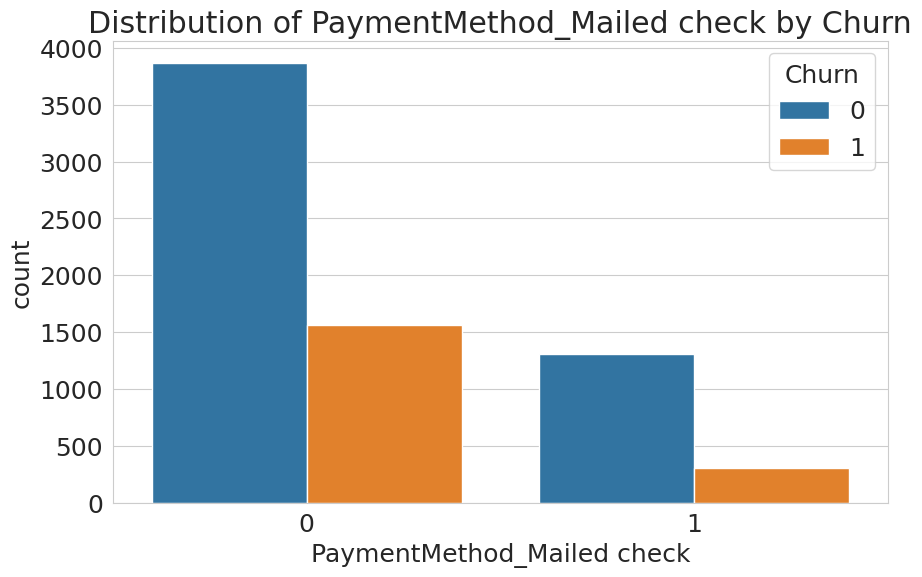

In [42]:
feature_columns = scaled_data.drop('Churn', axis=1).columns  # Excludem coloana care este variabila dependentă (Churn)

for feature in feature_columns:
        if scaled_data[feature].nunique() <= 5:  # Tratează variabilele categorice cu mai puțin de 5 valori distincte
            plt.figure(figsize=(10, 6))
            sns.countplot(x=feature, hue='Churn', data=scaled_data)
            plt.title(f'Distribution of {feature} by Churn')
            plt.show()
        else:  # Tratează variabilele continue sau cele cu mai mult de 5 valori distincte
            plt.figure(figsize=(10, 6))
            sns.histplot(data=scaled_data, x=feature, hue='Churn', kde=True, bins=30)
            plt.title(f'Distribution of {feature} by Churn')
            plt.show()

- Regarding gender, there is no significant difference between women and men.
- Most of the clients are not seniors, the elderly are more likely to give up services.
- People with a partner give up less than those without a partner.
- People who use the *telephone service do not present a significant risk of giving up*. People who don't use the phone service are even less likely to drop out.
- Customers without technical support tend to abandon more often than those who benefit from this service.
- *People with monthly contracts cancel the contract much more often than others, and those with two-year contracts very rarely quit.*


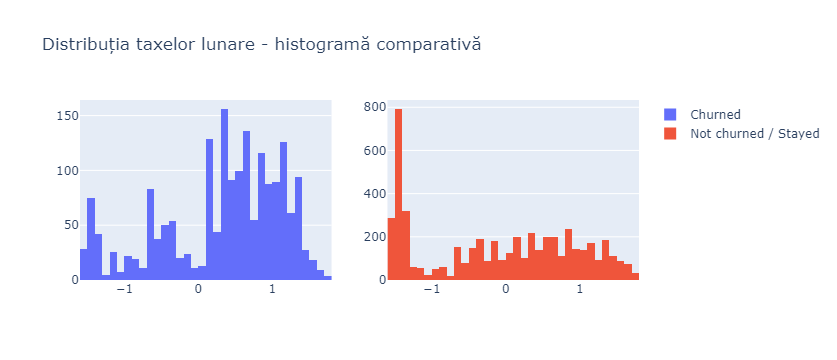

In [75]:
## In doua grafice alaturate reprezentati distributia distantei fata de casa (DistanceFromHome) pentru fiecare statut marital
from plotly.subplots import make_subplots
import plotly.graph_objects as go

x0 = scaled_data[scaled_data.Churn == 1].MonthlyCharges
x1 = scaled_data[scaled_data.Churn == 0].MonthlyCharges

fig = go.Figure()

# definim o matrice de imagini - numărul de linii și coloane decide așezarea în pagină
fig = make_subplots(rows=1, cols=2)

# imaginea din celula (1,1) - poate fi orice grafic, aici e una dintre histograme
fig.add_trace(go.Histogram(x=x0, name ='Churned'),
              row=1, col=1)

# imaginea din celula (1,2)
fig.add_trace(go.Histogram(x=x1, name = 'Not churned / Stayed'),
              row=1, col=2)

# adăugăm un titlu
fig.update_layout(title = 'Distribuția taxelor lunare - histogramă comparativă')
fig.show()

D:\anaconda\lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



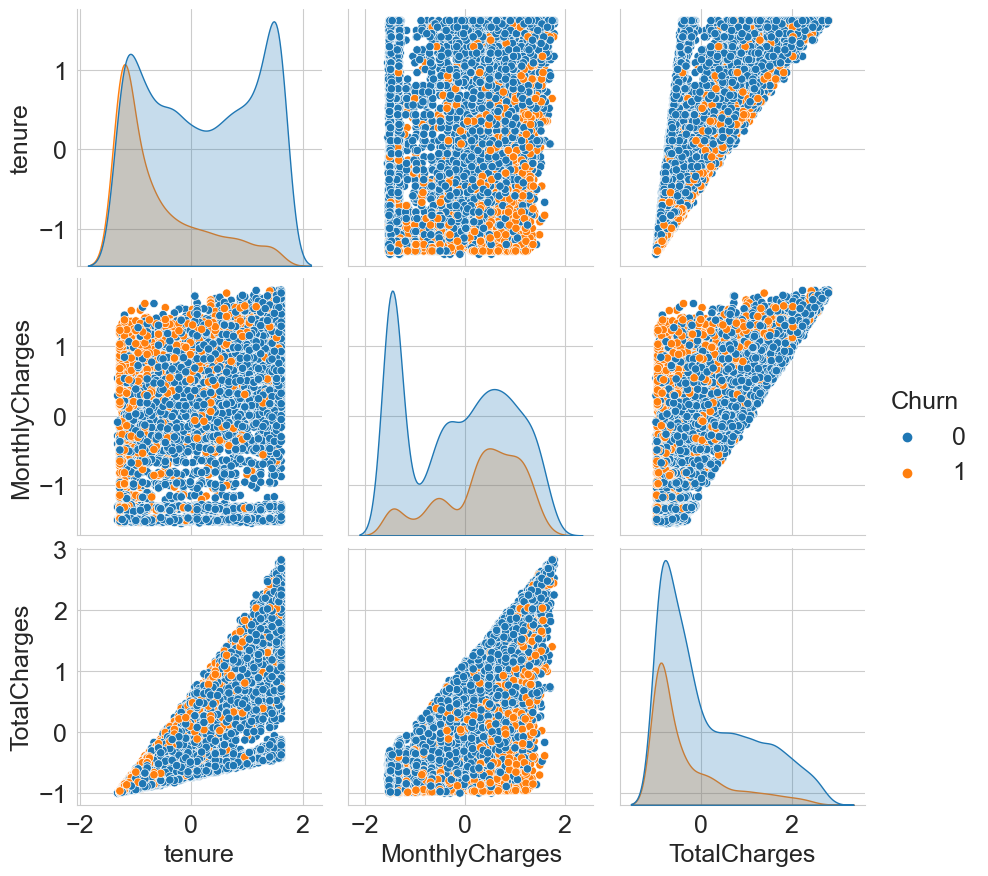

In [76]:
sns.set_style("whitegrid")
df_num_col = scaled_data[['tenure', 'MonthlyCharges', 'TotalCharges', 'Churn']]
sns.pairplot(scaled_data[[c for c in df_num_col ]],hue="Churn",height=3);
plt.show()

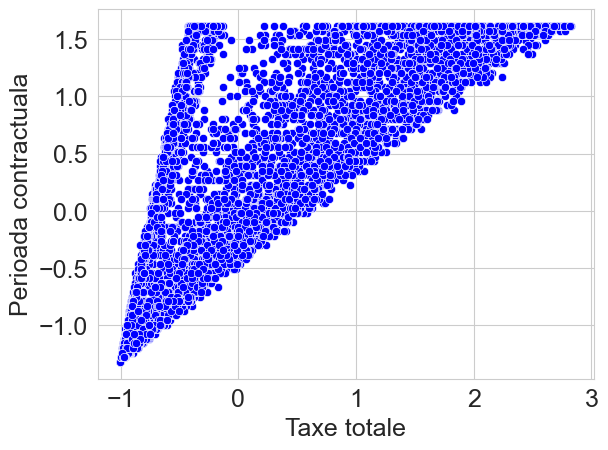

In [81]:
sns.scatterplot(x='TotalCharges', y='tenure', data = scaled_data, color='blue')

# Adaugă titlul și etichetele axelor
#plt.title('Scatter Plot de Exemplu')
plt.xlabel('Taxe totale')
plt.ylabel('Perioada contractuala')

# Afișează graficul
plt.show()

## II. Modeling classifiers

#### The target variable, **Churn** is binary, so the problems addressed will be CLASSIFICATION. br
I will use 80% of the data for training and 20% for the final test.

In [107]:
scalar = StandardScaler()

scaled_df = copy.deepcopy(data)

scaled_df = pd.DataFrame(scalar.fit_transform(data)) #standarziarea datelor
scaled_df.columns = data.columns # păstrăm numele coloanelor
scaled_df

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,...,InternetService_DSL,InternetService_Fiber optic,InternetService_No,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,-1.009559,-0.439916,1.034530,-0.654012,-1.277445,-3.054010,-0.854176,-0.633933,1.378241,-0.723968,...,1.381712,-0.885660,-0.525927,0.904184,-0.514249,-0.562975,-0.529885,-0.525047,1.406418,-0.544807
1,0.990532,-0.439916,-0.966622,-0.654012,0.066327,0.327438,-0.854176,1.577454,-0.725563,1.381277,...,1.381712,-0.885660,-0.525927,-1.105970,1.944582,-0.562975,-0.529885,-0.525047,-0.711026,1.835513
2,0.990532,-0.439916,-0.966622,-0.654012,-1.236724,0.327438,-0.854176,1.577454,1.378241,-0.723968,...,1.381712,-0.885660,-0.525927,0.904184,-0.514249,-0.562975,-0.529885,-0.525047,-0.711026,1.835513
3,0.990532,-0.439916,-0.966622,-0.654012,0.514251,-3.054010,-0.854176,1.577454,-0.725563,1.381277,...,1.381712,-0.885660,-0.525927,-1.105970,1.944582,-0.562975,1.887201,-0.525047,-0.711026,-0.544807
4,-1.009559,-0.439916,-0.966622,-0.654012,-1.236724,0.327438,-0.854176,-0.633933,-0.725563,-0.723968,...,-0.723740,1.129102,-0.525927,0.904184,-0.514249,-0.562975,-0.529885,-0.525047,1.406418,-0.544807
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0.990532,-0.439916,1.034530,1.529024,-0.340876,0.327438,1.170719,1.577454,-0.725563,1.381277,...,1.381712,-0.885660,-0.525927,-1.105970,1.944582,-0.562975,-0.529885,-0.525047,-0.711026,1.835513
7039,-1.009559,-0.439916,1.034530,1.529024,1.613701,0.327438,1.170719,-0.633933,1.378241,1.381277,...,-0.723740,1.129102,-0.525927,-1.105970,1.944582,-0.562975,-0.529885,1.904590,-0.711026,-0.544807
7040,-1.009559,-0.439916,1.034530,1.529024,-0.870241,-3.054010,-0.854176,1.577454,-0.725563,-0.723968,...,1.381712,-0.885660,-0.525927,0.904184,-0.514249,-0.562975,-0.529885,-0.525047,1.406418,-0.544807
7041,0.990532,2.273159,1.034530,-0.654012,-1.155283,0.327438,1.170719,-0.633933,-0.725563,-0.723968,...,-0.723740,1.129102,-0.525927,0.904184,-0.514249,-0.562975,-0.529885,-0.525047,-0.711026,1.835513


In [44]:
# y = scaled_data['Churn']
# X = scaled_data[scaled_data.drop('Churn', axis=1).columns] # Excludem ultima coloană care este variabila dependentă (Churn)

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)


#### Cross validation
It represents a method used to evaluate the performance of a regression model. This technique is designed to estimate how well a model generalizes to new data that was not used in the training process.

In [110]:
scaled_df.Churn

0      -0.601023
1      -0.601023
2       1.663829
3      -0.601023
4       1.663829
          ...   
7038   -0.601023
7039   -0.601023
7040   -0.601023
7041    1.663829
7042   -0.601023
Name: Churn, Length: 7043, dtype: float64

Atributele (toate coloanele) - variabilele *independente* și variabila țintă - *dependenta*:

In [111]:
X = scaled_df[['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'OnlineSecurity', 'OnlineBackup',
       'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
       'PaperlessBilling', 'MonthlyCharges', 'TotalCharges',
       'InternetService_DSL', 'InternetService_Fiber optic',
       'InternetService_No', 'Contract_Month-to-month', 'Contract_One year',
       'Contract_Two year', 'PaymentMethod_Bank transfer (automatic)',
       'PaymentMethod_Credit card (automatic)',
       'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check']]
y = data['Churn']

### LogisticRegression with regularization

Logistic regression is neither regression nor logistic: it is a <br> classifier

The link with regression is given by the fact that we model log(odds) with a linear regressor

$X$ only takes two values, 0 or 1. So $P(Y=1|X=x)$ has only two possibilities: the one for $X = 0$ and the one for $X = 1$.$.

##### Defining the list of parameters:


In [57]:
param_grid = [
     { 
         'penalty' : ['l1', 'l2'],          # parametrul penalty se referă la tipul de regularizare
         'C' : [2**i for i in range(-4,10)], # parametrul C al regularizarii
         'solver' : ['liblinear']           # tipul de algoritm folosit in aproximarea coeficientilor modelului
     }
]

##### **Cross Validation** for training data:
- method used to evaluate the performance of a regression model. This technique is designed to estimate how well a model generalizes to new data that was not used in the training process.
- we used 10 iterations -> With more iterations, we get a more robust picture of the model's performance, thus reducing the variability of the estimates.
##### Determination of the **Confusion Matrices** and model accuracy scores:


Fitting 10 folds for each of 28 candidates, totalling 280 fits
Iterația:  0
Cel mai bun scor de antrenament:  0.8017415567564845
Parametrii aferenți: {'C': 2, 'penalty': 'l2', 'solver': 'liblinear'}
Metrici finale pe test:
Matrice confuzie pe X_train (potrivirea):



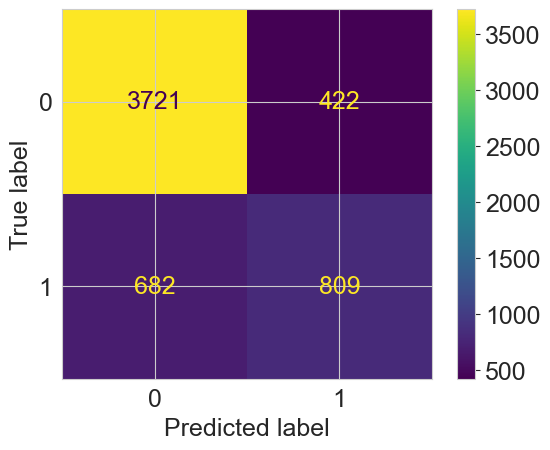

Metrici finale pe test:
Matrice confuzie pe X_test (evaluarea):



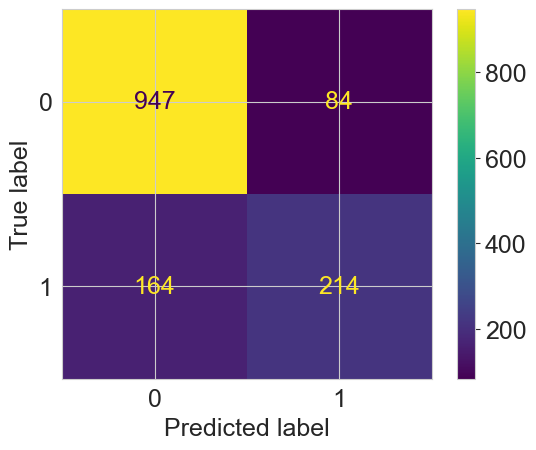

Fitting 10 folds for each of 28 candidates, totalling 280 fits
Iterația:  1
Cel mai bun scor de antrenament:  0.8068865500170063
Parametrii aferenți: {'C': 0.25, 'penalty': 'l1', 'solver': 'liblinear'}
Metrici finale pe test:
Matrice confuzie pe X_train (potrivirea):



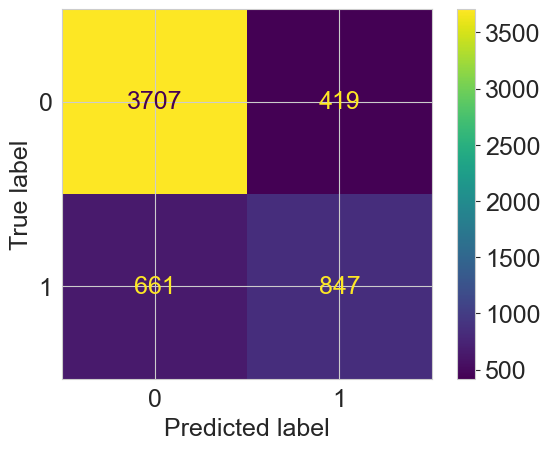

Metrici finale pe test:
Matrice confuzie pe X_test (evaluarea):



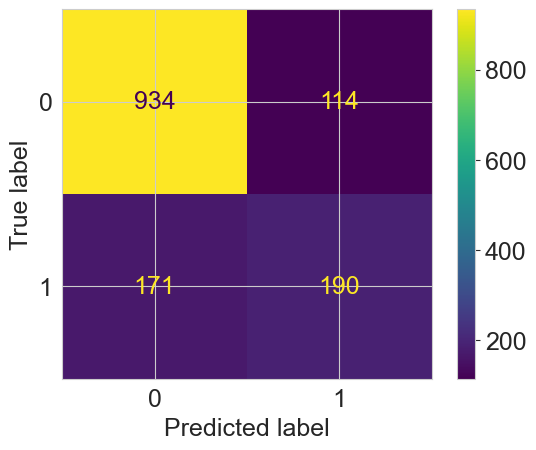

Fitting 10 folds for each of 28 candidates, totalling 280 fits
Iterația:  2
Cel mai bun scor de antrenament:  0.806176700301072
Parametrii aferenți: {'C': 0.25, 'penalty': 'l1', 'solver': 'liblinear'}
Metrici finale pe test:
Matrice confuzie pe X_train (potrivirea):



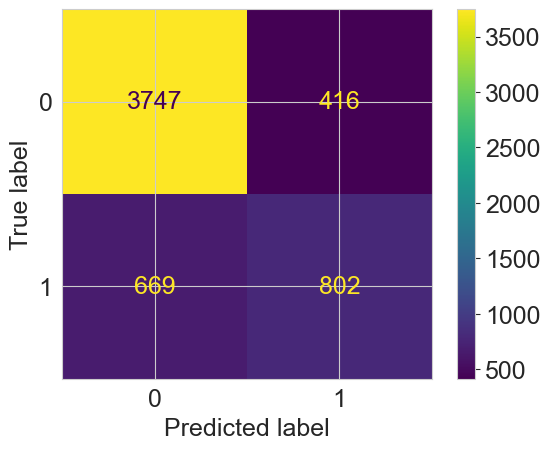

Metrici finale pe test:
Matrice confuzie pe X_test (evaluarea):



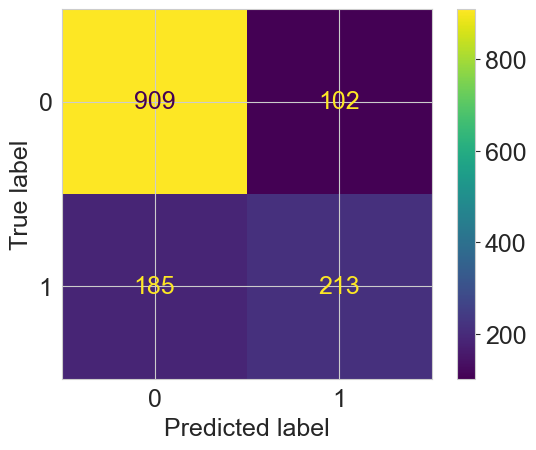

Fitting 10 folds for each of 28 candidates, totalling 280 fits
Iterația:  3
Cel mai bun scor de antrenament:  0.8051179093760629
Parametrii aferenți: {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}
Metrici finale pe test:
Matrice confuzie pe X_train (potrivirea):



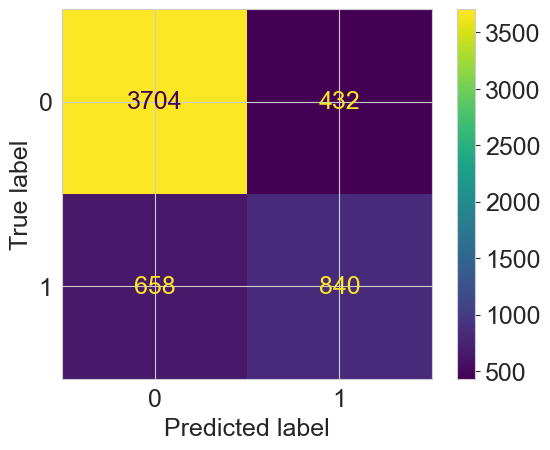

Metrici finale pe test:
Matrice confuzie pe X_test (evaluarea):



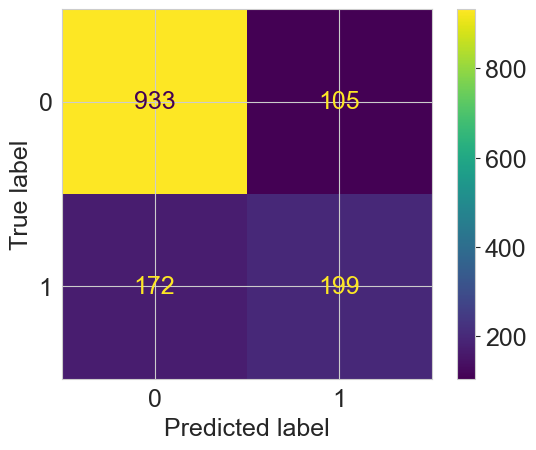

Fitting 10 folds for each of 28 candidates, totalling 280 fits
Iterația:  4
Cel mai bun scor de antrenament:  0.8068802514392249
Parametrii aferenți: {'C': 0.125, 'penalty': 'l2', 'solver': 'liblinear'}
Metrici finale pe test:
Matrice confuzie pe X_train (potrivirea):



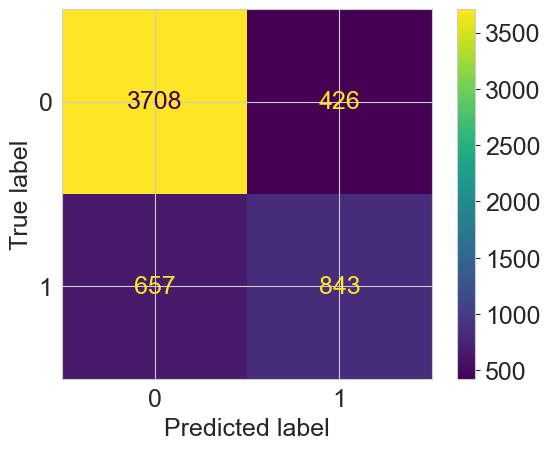

Metrici finale pe test:
Matrice confuzie pe X_test (evaluarea):



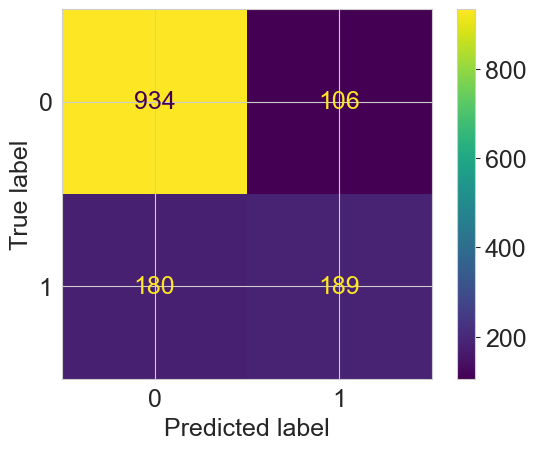

Fitting 10 folds for each of 28 candidates, totalling 280 fits
Iterația:  5
Cel mai bun scor de antrenament:  0.7999600040310897
Parametrii aferenți: {'C': 64, 'penalty': 'l2', 'solver': 'liblinear'}
Metrici finale pe test:
Matrice confuzie pe X_train (potrivirea):



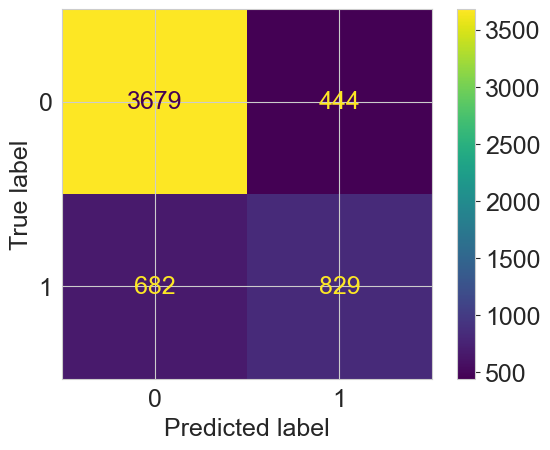

Metrici finale pe test:
Matrice confuzie pe X_test (evaluarea):



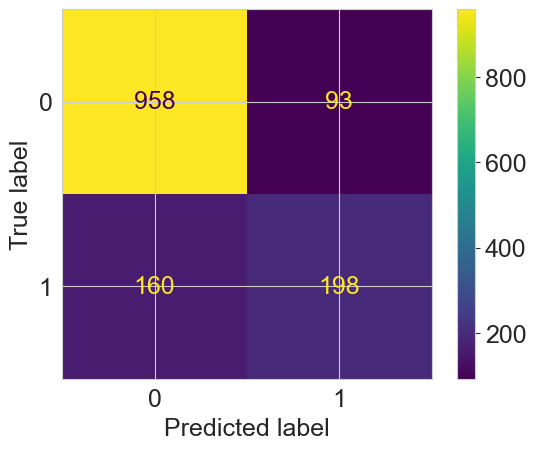

Fitting 10 folds for each of 28 candidates, totalling 280 fits
Iterația:  6
Cel mai bun scor de antrenament:  0.8083012105866496
Parametrii aferenți: {'C': 32, 'penalty': 'l1', 'solver': 'liblinear'}
Metrici finale pe test:
Matrice confuzie pe X_train (potrivirea):



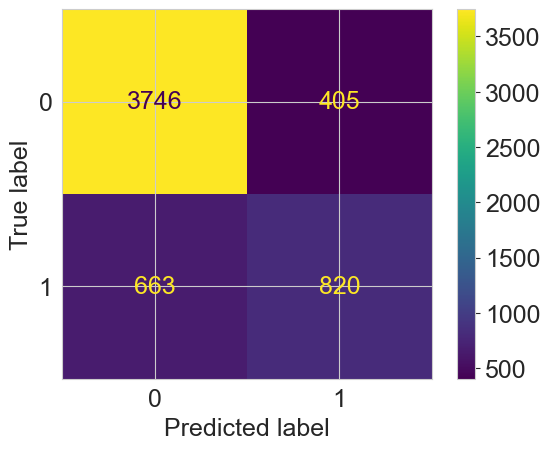

Metrici finale pe test:
Matrice confuzie pe X_test (evaluarea):



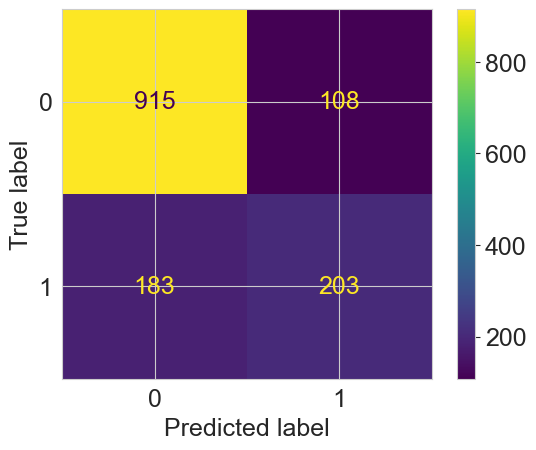

Fitting 10 folds for each of 28 candidates, totalling 280 fits
Iterația:  7
Cel mai bun scor de antrenament:  0.8019194915788015
Parametrii aferenți: {'C': 0.25, 'penalty': 'l1', 'solver': 'liblinear'}
Metrici finale pe test:
Matrice confuzie pe X_train (potrivirea):



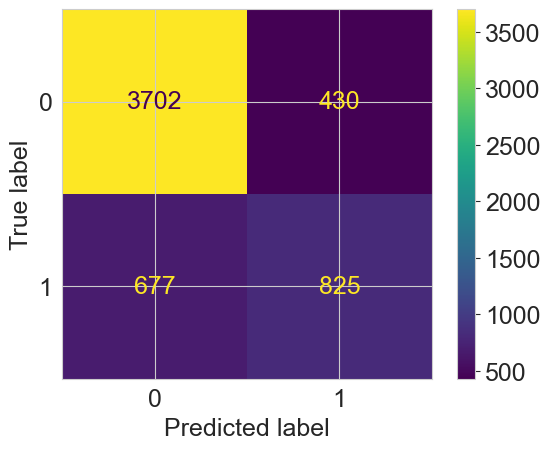

Metrici finale pe test:
Matrice confuzie pe X_test (evaluarea):



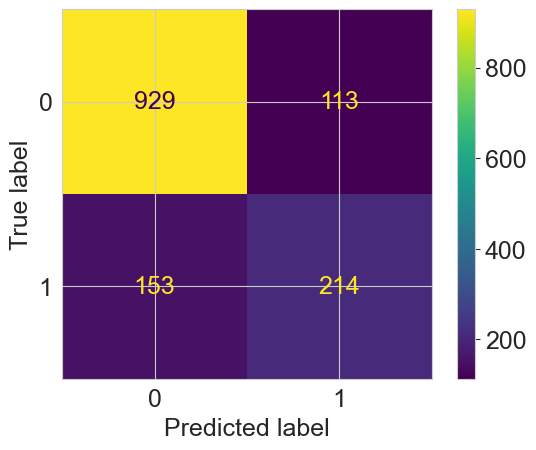

Fitting 10 folds for each of 28 candidates, totalling 280 fits
Iterația:  8
Cel mai bun scor de antrenament:  0.8056428958341206
Parametrii aferenți: {'C': 0.0625, 'penalty': 'l1', 'solver': 'liblinear'}
Metrici finale pe test:
Matrice confuzie pe X_train (potrivirea):



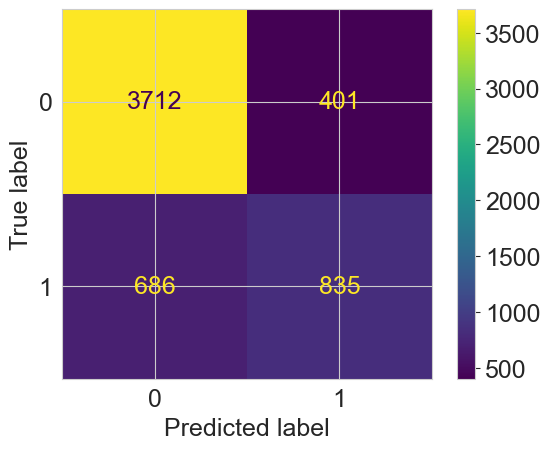

Metrici finale pe test:
Matrice confuzie pe X_test (evaluarea):



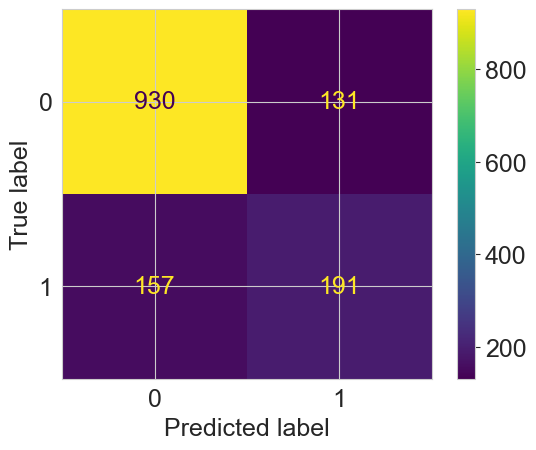

Fitting 10 folds for each of 28 candidates, totalling 280 fits
Iterația:  9
Cel mai bun scor de antrenament:  0.8006730030359144
Parametrii aferenți: {'C': 0.0625, 'penalty': 'l1', 'solver': 'liblinear'}
Metrici finale pe test:
Matrice confuzie pe X_train (potrivirea):



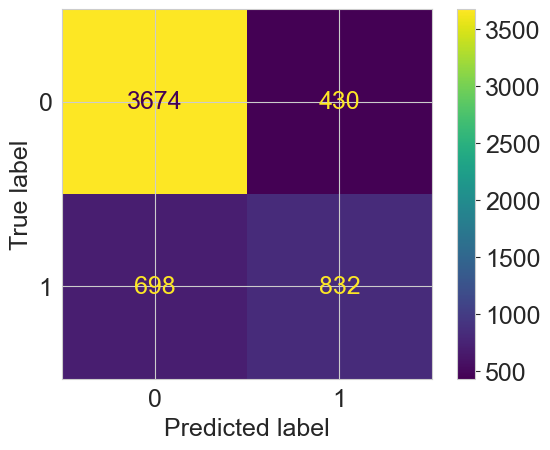

Metrici finale pe test:
Matrice confuzie pe X_test (evaluarea):



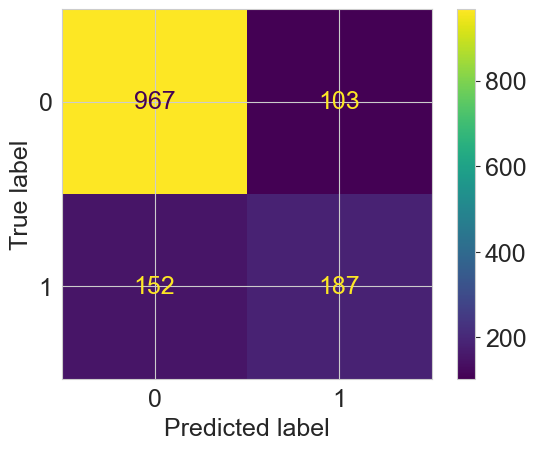

Acuratete medie: 0.805819730305181


,i,parametrii,C,penalty,solver,acuratețe test
0,0,"{'C': 2, 'penalty': 'l2', 'solver': 'liblinear'}",2.0000,l2,liblinear,0.823989
1,1,"{'C': 0.25, 'penalty': 'l1', 'solver': 'liblin...",0.2500,l1,liblinear,0.797729
2,2,"{'C': 0.25, 'penalty': 'l1', 'solver': 'liblin...",0.2500,l1,liblinear,0.796309
3,3,"{'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}",1.0000,l1,liblinear,0.803407
4,4,"{'C': 0.125, 'penalty': 'l2', 'solver': 'libli...",0.1250,l2,liblinear,0.797019
5,5,"{'C': 64, 'penalty': 'l2', 'solver': 'liblinear'}",64.0000,l2,liblinear,0.820440
6,6,"{'C': 32, 'penalty': 'l1', 'solver': 'liblinear'}",32.0000,l1,liblinear,0.793471
7,7,"{'C': 0.25, 'penalty': 'l1', 'solver': 'liblin...",0.2500,l1,liblinear,0.811214
8,8,"{'C': 0.0625, 'penalty': 'l1', 'solver': 'libl...",0.0625,l1,liblinear,0.795600
9,9,"{'C': 0.0625, 'penalty': 'l1', 'solver': 'libl...",0.0625,l1,liblinear,0.819021


In [124]:
#Antrenarea si testarea
overall = []
for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2) #, stratify = y) # 

    # setup antrenare cu validare incurcisata
    CV= GridSearchCV(LogisticRegression(), # modelul de clasificare
                     param_grid, # parametrii
                     cv= 10, # numarul de submultimi pentru validare incrucisata pe date de antrenament
                     scoring='accuracy', 
                     verbose=1, 
                     n_jobs = -1 #toate procesoarele
                    )

    # antrenare cu validare incrucisata
    CV.fit(X_train, y_train)   

    print('Iterația: ', i)
    print('Cel mai bun scor de antrenament: ', CV.best_score_)
    print('Parametrii aferenți:', CV.best_params_)
    
    model_final = LogisticRegression( C =  CV.best_params_['C'], 
                                     penalty = CV.best_params_['penalty'], 
                                     solver= CV.best_params_['solver'])
    model_final.fit(X_train,y_train)
    y_train_hat = model_final.predict(X_train)
    print('Metrici finale pe test:')
    print('Matrice confuzie pe X_train (potrivirea):\n')
    disp= met.ConfusionMatrixDisplay(met.confusion_matrix(y_train, y_train_hat))
    disp.plot()
    plt.show()
    met.precision_recall_fscore_support (y_train, y_train_hat)
    y_test_hat = model_final.predict(X_test)
    print('Metrici finale pe test:')

    print('Matrice confuzie pe X_test (evaluarea):\n')
    disp= met.ConfusionMatrixDisplay(met.confusion_matrix(y_test, y_test_hat))
    disp.plot()
    plt.show()
    met.precision_recall_fscore_support (y_test,y_test_hat)
    
    overall.append(
    {
        'i':i,
        'parametrii': CV.best_params_,
         'C' : CV.best_params_['C'], 
         'penalty' : CV.best_params_['penalty'], 
         'solver': CV.best_params_['solver'],
        'acuratețe test':met.accuracy_score(y_test,y_test_hat)
    })
    print('===============================================================================')
    
print("Acuratete medie:", sum([r['acuratețe test'] for r in overall])/len(overall))

pd.DataFrame(overall)  

In [113]:
pd.DataFrame(overall).sort_values(by = 'acuratețe test',ascending = False)

,i,parametrii,C,penalty,solver,acuratețe test
5,5,"{'C': 16, 'penalty': 'l2', 'solver': 'liblinear'}",16.0000,l2,liblinear,0.814053
6,6,"{'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}",1.0000,l2,liblinear,0.814053
2,2,"{'C': 2, 'penalty': 'l1', 'solver': 'liblinear'}",2.0000,l1,liblinear,0.811923
1,1,"{'C': 0.25, 'penalty': 'l1', 'solver': 'liblin...",0.2500,l1,liblinear,0.809084
3,3,"{'C': 0.25, 'penalty': 'l1', 'solver': 'liblin...",0.2500,l1,liblinear,0.806955
4,4,"{'C': 2, 'penalty': 'l1', 'solver': 'liblinear'}",2.0000,l1,liblinear,0.806246
8,8,"{'C': 0.5, 'penalty': 'l1', 'solver': 'libline...",0.5000,l1,liblinear,0.804826
0,0,"{'C': 0.0625, 'penalty': 'l1', 'solver': 'libl...",0.0625,l1,liblinear,0.803407
9,9,"{'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}",1.0000,l1,liblinear,0.800568
7,7,"{'C': 0.0625, 'penalty': 'l1', 'solver': 'libl...",0.0625,l1,liblinear,0.797019


In [123]:
print("Acuratete medie:", sum([r['acuratețe test'] for r in overall])/len(overall))

Acuratete medie: 0.8016323633782825


### SVM classifier - (Support Vector Machine)
- Model instantiation
- Setting Search Parameters in the Grid
- Grid Search with Cross Validation
- Choosing the Best Parameters and the Best Model
   br
- Parallel Cross Validation Cycle: <br>

A cross-validation cycle is executed 5 times (for i in range(5
- Average accuracy is calculated based on the accuracy scores obtained in each iteration. br
**The ultimate goal is to evaluate the performance of the SVM model in the context of cross-validation and to observe the variability of the results in different runs. Average accuracy provides a general estimate of model per RULAT**
  )

In [129]:
def antrenament_scikitlearn_svmclsf(X,y):
    
    # instațiem un model
    svmclsf = svm.SVC()#random_state=42)
    
    # setăm parametrii pe care vrem să îi încercăm
    param_grid ={'kernel':['linear','poly','rbf'],
             'C':[ 0.5 ,0.1, 1, 10, 100, 1000]}
    
    # folosim  antrenare cu validare încrucișată
    CV_svmclsf = GridSearchCV(estimator=svmclsf, 
                          param_grid=param_grid, 
                          scoring = 'accuracy', # aici e diferenta fata de clasificator - metrica aleasa pentru evaluare
                          cv = 10, 
                          n_jobs = 6,
                         error_score='raise')
    # pasul de antrenare
    CV_svmclsf.fit(X, y)
    
    # returnăm cei mai buni parametrii și cel mai bun model
    return CV_svmclsf.best_params_, CV_svmclsf.best_estimator_

In [130]:
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

# 5 iteratii 
results_CV_paralel = []
for i in range(5):
    
    print("Iteration {0}".format(i))
    # Split dataset în set de antrenament și set de test 
    X_train, X_test, y_train, y_test = train_test_split(X, 
                                                        data['Churn'], 
                                                        test_size=0.2,
                                                       stratify = data['Churn'],
                                                       shuffle = True) # 80% training / 20% test

    params,model = antrenament_scikitlearn_svmclsf(X_train, y_train)
    
    # prognozăm cu cel mai bun model
    y_test_pred = model.predict(X_test)
    results_CV_paralel.append({
        'accuracy_score': accuracy_score(y_true = y_test, y_pred=y_test_pred),
        'parametrii': params}
        )
    
    
print("Acuratete medie:", sum([r['accuracy_score'] for r in results_CV_paralel])/len(results_CV_paralel))

pd.DataFrame(results_CV_paralel)

Iteration 0
Iteration 1
Iteration 2
Iteration 3
Iteration 4
Acuratete medie: 0.8018452803406673


,accuracy_score,parametrii
0,0.796309,"{'C': 0.5, 'kernel': 'rbf'}"
1,0.799148,"{'C': 1000, 'kernel': 'linear'}"
2,0.807665,"{'C': 1000, 'kernel': 'linear'}"
3,0.809084,"{'C': 0.5, 'kernel': 'rbf'}"
4,0.797019,"{'C': 0.5, 'kernel': 'rbf'}"


## Example of training a classification tree with GridSearch

In [127]:
from sklearn.ensemble import GradientBoostingClassifier
def antrenament_scikitlearn_xgb_c(X,y):
    
    model = GradientBoostingClassifier()#random_state=42)
    param_grid = {
                    'n_estimators' : [10, 100, 1000],
                    'learning_rate' : [0.001, 0.01, 0.1],
                    #'subsample' : [0.5, 0.7, 1.0],
                    #'max_depth' : [3, 7, 9]
                 }
     # folosim  antrenare cu validare încrucișată
    CV_model = GridSearchCV(estimator=model, 
                          param_grid=param_grid, 
                          scoring = 'neg_mean_absolute_error', # aici e diferenta fata de clasificator - metrica aleasa pentru evaluare
                          cv = 10, 
                          n_jobs = 6,
                         error_score='raise')
    # pasut de antrenare
    CV_model.fit(X, y)
    
    # returnăm cei mai buni parametrii și cel mai bun model
    return CV_model.best_params_, CV_model.best_estimator_



In [128]:
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

# 5 iteratii 
results_CV_paralel = []
for i in range(5):
    
    print("Iteration {0}".format(i))
    # Split dataset în set de antrenament și set de test 
    X_train, X_test, y_train, y_test = train_test_split(X, 
                                                        data['Churn'], 
                                                        test_size=0.2,
                                                       stratify = data['Churn'],
                                                       shuffle = True) # 70% training / 30% test

    params,model = antrenament_scikitlearn_xgb_c(X_train, y_train)
    
    # prognozăm cu cel mai bun model
    y_test_pred = model.predict(X_test)
    results_CV_paralel.append({
        'accuracy_score': accuracy_score(y_true = y_test, y_pred=y_test_pred),
        'parametrii': params}
        )
    
    
print("Acuratete medie:", sum([r['accuracy_score'] for r in results_CV_paralel])/len(results_CV_paralel))

pd.DataFrame(results_CV_paralel)

Iteration 0
Iteration 1
Iteration 2
Iteration 3
Iteration 4
Acuratete medie: 0.8073811213626685


,accuracy_score,parametrii
0,0.814762,"{'learning_rate': 0.01, 'n_estimators': 1000}"
1,0.813343,"{'learning_rate': 0.1, 'n_estimators': 100}"
2,0.798439,"{'learning_rate': 0.01, 'n_estimators': 1000}"
3,0.805536,"{'learning_rate': 0.01, 'n_estimators': 1000}"
4,0.804826,"{'learning_rate': 0.01, 'n_estimators': 1000}"
